In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import matplotlib.animation as animation
from IPython.display import display, HTML, Image
%matplotlib inline

### Visualization of Australian wildfires from 2019-10-02 to 2020-01-11
Using NASA Satellite Data MODISC6 and VIIRS 375m [DataSet](https://www.kaggle.com/carlosparadis/fires-from-space-australia-and-new-zeland)

In [2]:
data_path = os.getcwd() + '/fire_nrt_V1_96617.csv'
data = pd.read_csv(data_path)
data.describe()

,latitude,longitude,bright_ti4,scan,track,acq_time,bright_ti5,frp
count,956257.000000,956257.000000,956257.000000,956257.000000,956257.000000,956257.000000,956257.000000,956257.000000
mean,-27.465569,142.191838,333.922148,0.460398,0.480464,986.334617,299.311259,15.557809
std,8.008223,10.986038,21.988456,0.089811,0.118792,555.548115,14.724600,45.584396
min,-43.212320,113.447010,208.000000,0.320000,0.360000,224.000000,150.000000,0.000000
25%,-33.133860,132.291060,312.800000,0.390000,0.380000,418.000000,289.500000,2.100000
50%,-30.489390,147.987880,336.700000,0.430000,0.440000,1400.000000,295.600000,5.200000
75%,-19.142220,150.751010,351.000000,0.510000,0.570000,1512.000000,307.600000,13.200000
max,-9.396500,153.452180,367.000000,0.800000,0.780000,1824.000000,380.000000,10717.200000


Visulization used Matplotlib animation and Basemap to show spreding of australians bushfires in time.
Dataset containe coordinates of fire pixel where every pont represent 375 x 375 m area(thick estimation 21.03 Ha).
One frame is one day.

For estimating how much animals died per day I used information from [BBC article](https://www.bbc.com/news/50986293)

In [45]:
def update(i):
    try:
        global scat, count_fire_area, j
        scat.remove()
        data = tmp[tmp.acq_date == all_days[j]]

        scat = m.scatter(data['longitude'], data['latitude'], 
        s=data['scan']/100, label="Wildefires",
        c=data['bright_ti4'], cmap='autumn', zorder = 3)

        day_text.set_text(str(all_days[j]))
        ha_now = data['longitude'].count()*21.03
        count_fire_area += ha_now

        ha_text.set_text('Fire area in this day: {:.2f} Ha'.format(ha_now))
        animal_deads_text.set_text('Animal deads: {:.2e} total\n{:.2e} mammals\n{:.2e} birds\n{:.2e} reptiles'.format( 
                                   int(count_fire_area*(17.5+20.7+129.5)), 
                                   int(count_fire_area*17.5), 
                                   int(count_fire_area*20.7), 
                                   int(count_fire_area*129.5)))
        j+=1
        plt.draw()
    except:
        pass

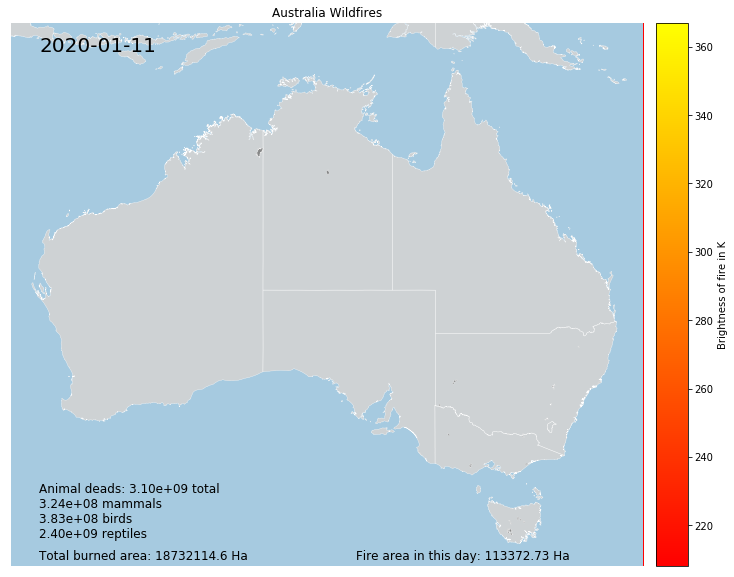

In [46]:
fig = plt.figure(figsize=(18,10))

tmp = data[data.confidence != 'l']
all_days = pd.unique(tmp.acq_date)
all_days = list(all_days)

m=Basemap(resolution='h',llcrnrlat=data.latitude.min()-2, 
          urcrnrlat=data.latitude.max()+2,
          llcrnrlon=data.longitude.min()-2,
          urcrnrlon=data.longitude.max()+2)

m.drawmapboundary(fill_color='#A6CAE0', linewidth=0)
m.drawstates(color='white')
m.drawcountries(color='white')
m.fillcontinents(color='lightgray', alpha=0.9, lake_color='grey', zorder = 1)
m.drawcoastlines(linewidth=0.3, color="white", zorder=2)
scat = m.scatter([0],[0], cmap='autumn')

first_day_new_fireplaces = [0]
count_fire_area = 0
j = 0

plt.title("Australia Wildfires")
day_text = plt.text(data.longitude.min(), data.latitude.max(), " ",fontsize=20, zorder = 11)
ha_text = plt.text(data.longitude.max()-18, data.latitude.min()-1.5, " ",fontsize=12, zorder = 11)
animal_deads_text = plt.text(data.longitude.min(), data.latitude.min(), " ",fontsize=12, zorder = 11)
plt.text(data.longitude.min(), data.latitude.min()-1.5, "Total burned area: " + str(tmp.longitude.count()*21.3)+" Ha",fontsize=12, zorder = 11)


im = m.imshow(np.arange(100).reshape((10, 10)),cmap='autumn',  interpolation='nearest')
im.set_clim(data['bright_ti4'].min(), data['bright_ti4'].max())

cbar = m.colorbar(im, location='right')
cbar.set_label('Brightness of fire in K')

ani = animation.FuncAnimation(fig, update, frames=len(all_days)-1)

HTML(ani.to_jshtml())